In [1]:
import os
import random
import matplotlib.pyplot as plt
import cv2

import mmseg
from mmcv.transforms import Compose
from mmengine.registry import init_default_scope

try:
    init_default_scope('mmseg')
except AssertionError:
    pass

In [2]:
# 1. Recreate your pipeline EXACTLY as it is in config.py, MINUS PackSegInputs
pipeline_cfg = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'), 
    dict(type='RandomResize', scale=(2048, 512), ratio_range=(0.5, 2.0), keep_ratio=True),
    dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
    
    # Albu transforms from your config
    dict(
        type='Albu',
        transforms=[
            dict(type='OneOf', transforms=[
                dict(type='GaussianBlur', blur_limit=(1, 3), p=1.0),
                dict(type='GaussNoise', var_limit=(5.0, 30.0), p=1.0),
            ], p=0.3)
        ],
        keymap=dict(img='image', gt_seg_map='mask'),
        update_pad_shape=False,
    ),
    
    dict(type='PhotoMetricDistortion'),
    dict(type='mmcv.RandomGrayscale', prob=0.1, keep_channels=True),
    dict(type='RandomFlip', prob=0.5, direction='horizontal'),
    dict(type='RandomFlip', prob=0.5, direction='vertical'),
]

# Build the pipeline processor
pipeline = Compose(pipeline_cfg)

/opt/conda/lib/python3.10/site-packages/mmseg/datasets/transforms/transforms.py:2395: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  return obj_cls(**args)


In [3]:
# 2. Feed it a dummy input pointing to your mapped data directory
data_folder = '/app/data/2026-01-19-defect_dataset/'
img_folder = os.path.join(data_folder, 'images')
label_folder = os.path.join(data_folder, 'labels_basic_defects_relabel')

NUM_IMG = 70

all_images = [f for f in os.listdir(img_folder) if f.endswith('.jpg')]

# 2. Select 50 random images (or the max available if under 50)
num_samples = min(NUM_IMG, len(all_images))
random_images = random.sample(all_images, num_samples)

Processing 13c40bf2-7e36-489b-86d7-09499b36d594-04696_orig.jpg 5 times...


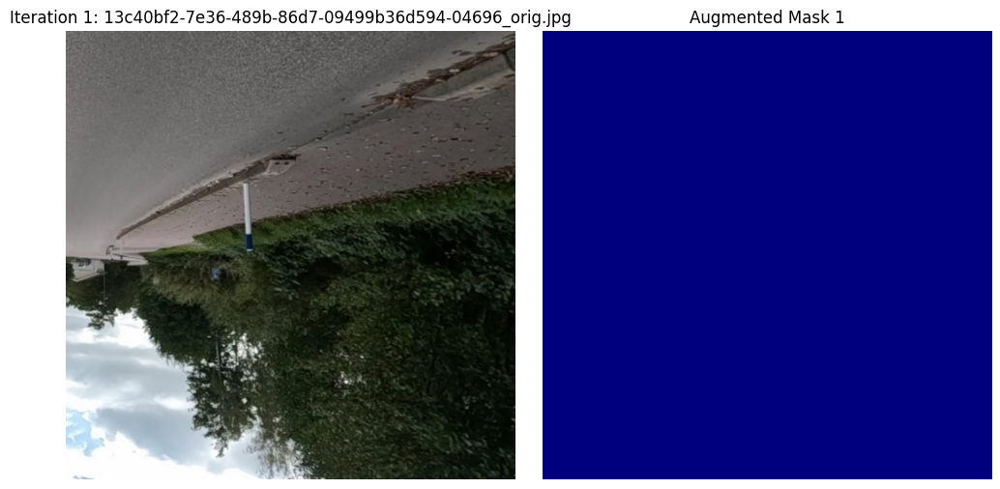

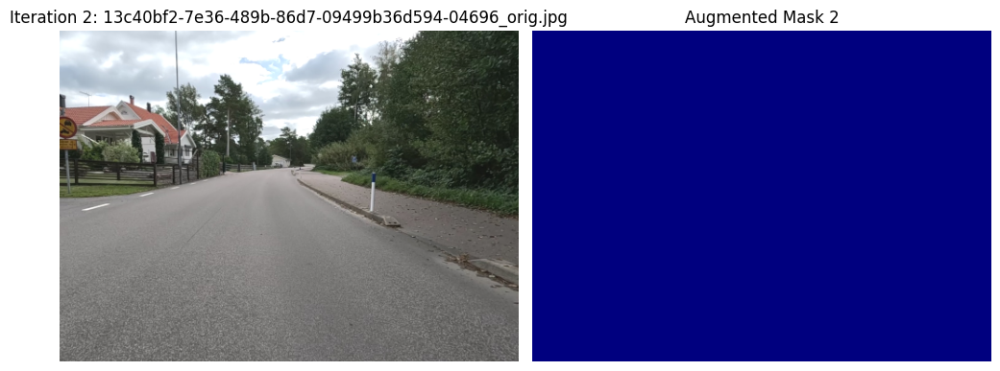

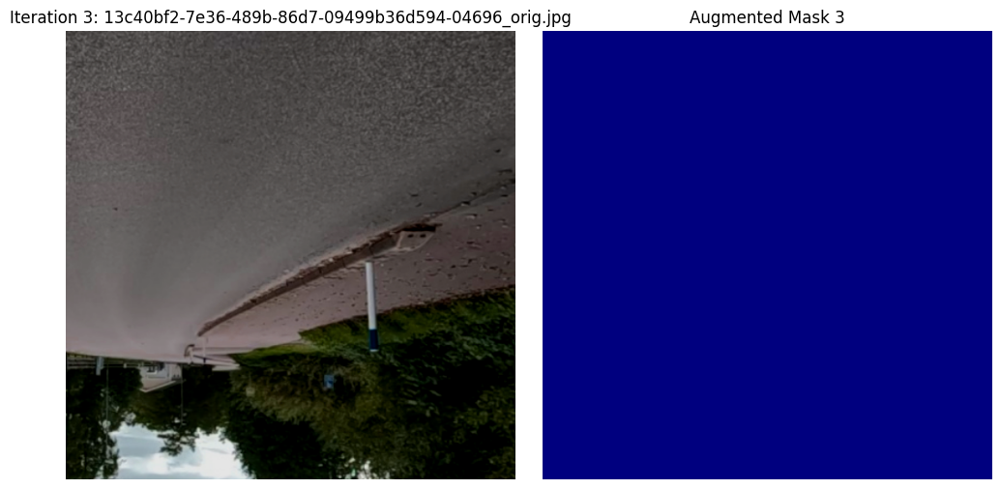

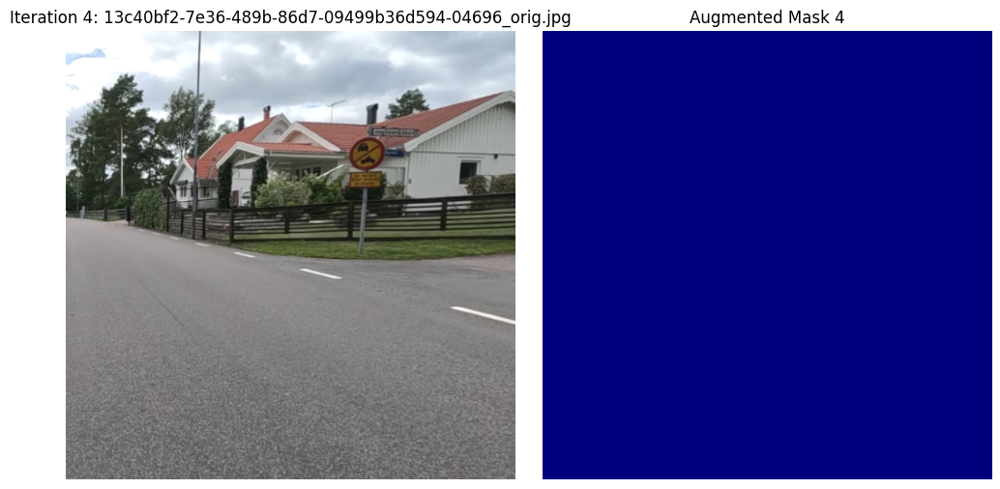

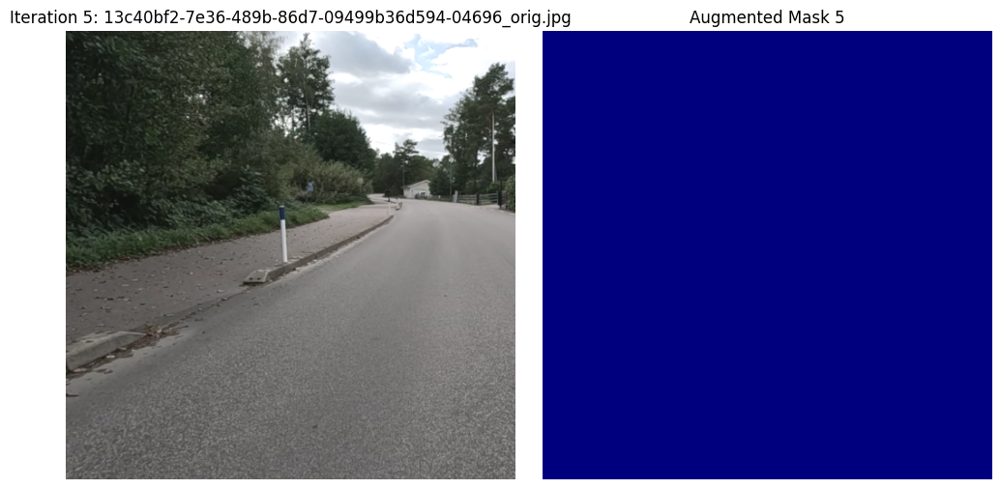

In [4]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# 1. Pick a single random image from your list
random_img_name = random.choice(random_images)
num_iterations = 5  # Set how many different outcomes you want to see

img_path = os.path.join(img_folder, random_img_name)
mask_name = random_img_name.replace('.jpg', '.png')
label_path = os.path.join(label_folder, mask_name)

# Check if mask exists once before starting the loop
if not os.path.exists(label_path):
    print(f"Mask not found for {random_img_name}.")
else:
    print(f"Processing {random_img_name} {num_iterations} times...")

    # 2. Loop for the specified number of iterations
    for i in range(num_iterations):
        data_info = dict(
            img_path=img_path,
            seg_map_path=label_path,
            reduce_zero_label=False,
            seg_fields=[]
        )
        
        try:
            # Each call to pipeline triggers random augmentations
            results = pipeline(data_info)
            
            # 3. Visualize the result for this iteration
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))
            
            # Convert BGR to RGB for plotting
            ax[0].imshow(cv2.cvtColor(results['img'], cv2.COLOR_BGR2RGB))
            ax[0].set_title(f'Iteration {i+1}: {random_img_name}')
            ax[0].axis('off')

            ax[1].imshow(results['gt_seg_map'], cmap='jet')
            ax[1].set_title(f'Augmented Mask {i+1}')
            ax[1].axis('off')
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error processing iteration {i+1}: {e}")
            break

{'flip': False,
 'flip_direction': None,
 'gt_seg_map': array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 'img': array([[[ 26,  36,  26],
        [ 30,  40,  30],
        [ 26,  34,  24],
        ...,
        [255, 255, 255],
        [255, 255, 253],
        [255, 255, 252]],

       [[ 28,  38,  28],
        [ 28,  38,  28],
        [ 27,  37,  27],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 253]],

       [[ 32,  42,  32],
        [ 25,  35,  25],
        [ 25,  35,  25],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 254]],

       ...,

       [[101, 103, 104],
        [123, 124, 125],
        [112, 113, 115],
        ...,
        [104, 106, 107],
        [126, 128, 129],
        [123, 124, 125]],

       [[112, 114, 115],
        [104, 106, 

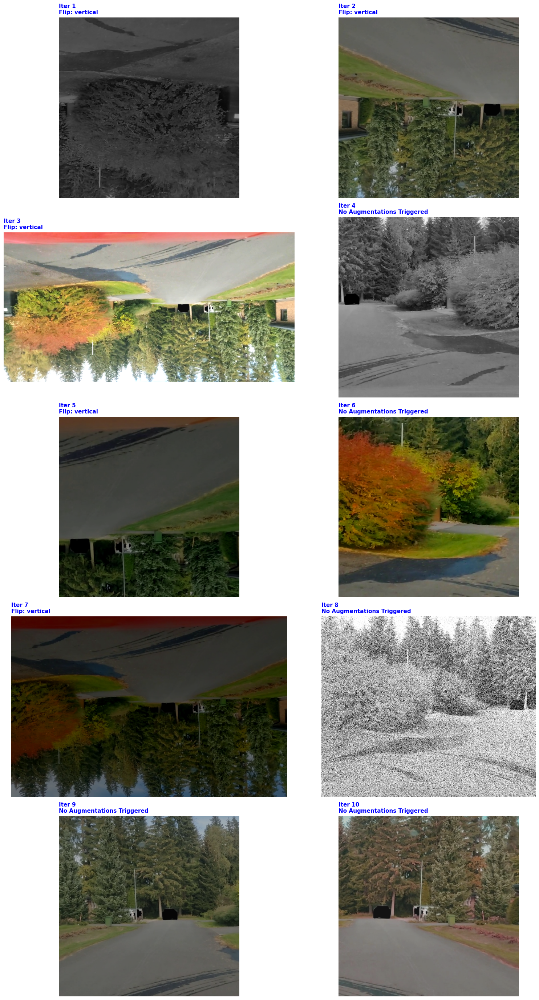

In [5]:
import random
import os
import cv2
import matplotlib.pyplot as plt
import math
import numpy as np
import pprint 

# --- 1. CONFIGURATION UPDATE ---
# Ensure your pipeline definition for 'Albu' includes: replay_mode=True
# Example: dict(type='Albu', transforms=my_albu_transforms, replay_mode=True)

random_img_name = random.choice(random_images)
num_iterations = 10  
cols = 2 
rows = math.ceil(num_iterations / cols)

img_path = os.path.join(img_folder, random_img_name)
label_path = os.path.join(label_folder, random_img_name.replace('.jpg', '.png'))

if not os.path.exists(label_path):
    print(f"File not found.")
else:
    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 6))
    axes = axes.flatten()
    
    for i in range(num_iterations):
        data_info = dict(img_path=img_path, seg_map_path=label_path, reduce_zero_label=False, seg_fields=[])
        pprint.pprint(results)
        
        try:
            results = pipeline(data_info)
            applied = []

            # A. Standard MMSeg Params
            if results.get('flip'):
                applied.append(f"Flip: {results.get('flip_direction')}")
            
            # B. EXTRACTING EXACT ALBU VALUES
            # When replay_mode=True, Albu stores data in 'albu_params'
            if 'albu_params' in results:
                for transform in results['albu_params'].get('transforms', []):
                    # Only show the one that was actually applied
                    if transform.get('applied', False):
                        name = transform.get('__class_fullname__')
                        
                        if 'GaussianBlur' in name:
                            # This will show the exact sigma used
                            applied.append(f"Blur Sigma: {transform.get('sigma')}")
                            
                        if 'GaussNoise' in name:
                            # This will show the exact noise variance/params
                            applied.append(f"Noise Params: {transform.get('var_limit')}")

            # C. PhotoMetricDistortion exact values
            if 'distort_params' in results:
                d = results['distort_params']
                applied.append(f"Bright Delta: {d.get('brightness_delta', 0):.2f}")
                applied.append(f"Contrast Low/High: {d.get('contrast_lower', 0):.2f}/{d.get('contrast_upper', 0):.2f}")

            aug_text = "\n".join(applied) if applied else "No Augmentations Triggered"
            img_rgb = cv2.cvtColor(results['img'], cv2.COLOR_BGR2RGB)
            
            axes[i].imshow(img_rgb)
            axes[i].set_title(f"Iter {i+1}\n{aug_text}", fontsize=11, fontweight='bold', loc='left', color='blue')
            axes[i].axis('off')
            
        except Exception as e:
            axes[i].text(0.5, 0.5, f"Error: {e}", ha='center')
            axes[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [6]:
import pprint
pprint.pprint(results) # This will print EVERY hidden value in the terminal

{'flip': False,
 'flip_direction': None,
 'gt_seg_map': array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 'img': array([[[100, 114, 113],
        [100, 110, 107],
        [ 95, 104,  96],
        ...,
        [111, 122, 110],
        [109, 116, 104],
        [125, 133, 117]],

       [[ 97, 113, 114],
        [101, 113, 110],
        [101, 111, 103],
        ...,
        [116, 126, 114],
        [127, 133, 121],
        [146, 153, 139]],

       [[ 97, 112, 114],
        [ 91, 105, 103],
        [113, 124, 119],
        ...,
        [115, 124, 111],
        [125, 133, 121],
        [127, 134, 121]],

       ...,

       [[109, 112, 115],
        [109, 112, 115],
        [107, 111, 115],
        ...,
        [111, 115, 117],
        [111, 115, 117],
        [111, 115, 117]],

       [[102, 105, 108],
        [103, 107, 

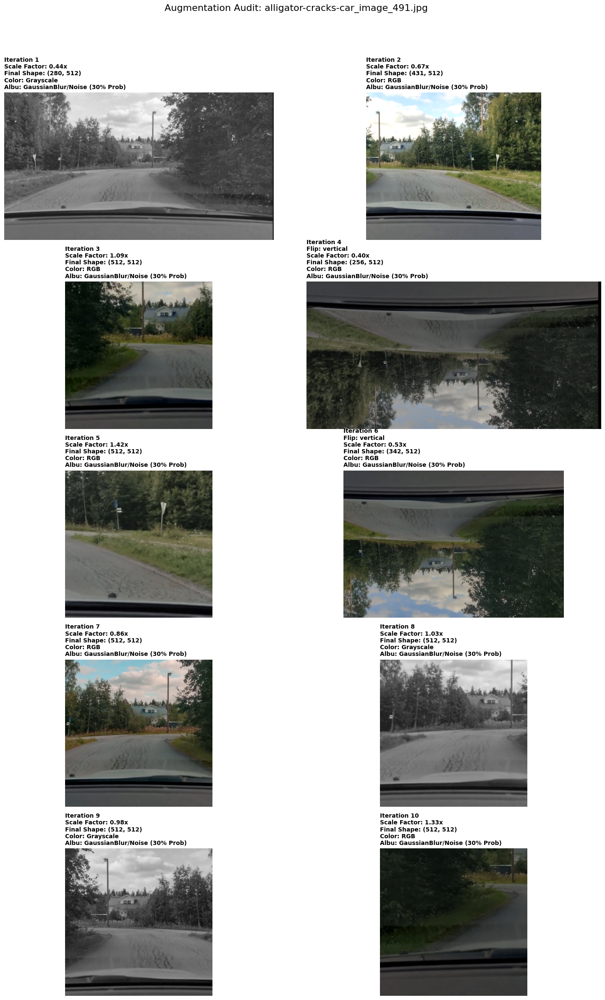

In [35]:
import random
import os
import cv2
import matplotlib.pyplot as plt
import math
import numpy as np

# 1. Configuration
random_img_name = random.choice(random_images)
num_iterations = 10  
cols = 2 
rows = math.ceil(num_iterations / cols)

img_path = os.path.join(img_folder, random_img_name)
label_path = os.path.join(label_folder, random_img_name.replace('.jpg', '.png'))

if not os.path.exists(label_path):
    print(f"File not found.")
else:
    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 5))
    axes = axes.flatten()
    
    for i in range(num_iterations):
        data_info = dict(img_path=img_path, seg_map_path=label_path, reduce_zero_label=False, seg_fields=[])
        
        try:
            results = pipeline(data_info)
            applied = []

            # --- A. Metadata from your dictionary ---
            # Flip Logic
            if results.get('flip'):
                applied.append(f"Flip: {results.get('flip_direction')}")
            
            # Scale Logic (Mapping from your 'scale_factor')
            sf = results.get('scale_factor', (1, 1))
            applied.append(f"Scale Factor: {sf[0]:.2f}x")

            # Final Shape
            applied.append(f"Final Shape: {results.get('img_shape')}")

            # --- B. Pixel-Level Detection (The "Forensics") ---
            img = results['img']
            
            # 1. Check for Grayscale (RandomGrayscale)
            # If all channels are equal, it was grayscaled
            if np.allclose(img[:,:,0], img[:,:,1], atol=1) and np.allclose(img[:,:,1], img[:,:,2], atol=1):
                applied.append("Color: Grayscale")
            else:
                applied.append("Color: RGB")

            # 2. Check for PhotoMetricDistortion
            # This is hard to get a single number for, so we check for 'distort_params'
            if 'distort_params' in results:
                applied.append(f"Distortion: Active")

            # --- C. The Albu Problem ---
            # Because Albu doesn't report back, we note that it was in the pipeline
            # and visible if noise/blur is present.
            applied.append("Albu: GaussianBlur/Noise (30% Prob)")

            aug_text = "\n".join(applied)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axes[i].imshow(img_rgb)
            axes[i].set_title(f"Iteration {i+1}\n{aug_text}", fontsize=10, fontweight='bold', loc='left')
            axes[i].axis('off')
            
        except Exception as e:
            axes[i].text(0.5, 0.5, f"Error: {e}", ha='center')
            axes[i].axis('off')

    plt.suptitle(f"Augmentation Audit: {random_img_name}", fontsize=16, y=0.98)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()